<a href="https://colab.research.google.com/github/skourta/clustering_eval/blob/main/MNIST5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
install.packages("R.matlab")

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



In [ ]:
install.packages(c("Rmixmod", "NbClust", "mclust", "FactoMineR", "Rmixmod", "Rtsne", "lle", "cluster", "aricode", "caret"))

In [ ]:
install.packages("umap")

# 1 Introduction au tables de donnees

In [ ]:
library(R.matlab)
library(Rmixmod)
library(mclust)
library(NbClust)
library(FactoMineR)
library(lle)
library(cluster)
library(aricode)
library(Rtsne)
library(caret)
library(umap)

R.matlab v3.6.2 (2018-09-26) successfully loaded. See ?R.matlab for help.


Attaching package: ‘R.matlab’


The following objects are masked from ‘package:base’:

    getOption, isOpen


Loading required package: Rcpp

Rmixmod v. 2.1.6 / URI: www.mixmod.org

Package 'mclust' version 5.4.9
Type 'citation("mclust")' for citing this R package in publications.

Loading required package: scatterplot3d

Loading required package: MASS

Loading required package: snowfall

Loading required package: snow

Loading required package: ggplot2

Loading required package: lattice

Warning message:
“Failed to locate timezone database”


In [ ]:
mnist=readMat("data/MNIST5.mat")

# MNIST5

## Visualisation des donnees

In [ ]:
pca.mnist=PCA((mnist$X),ncp=2)

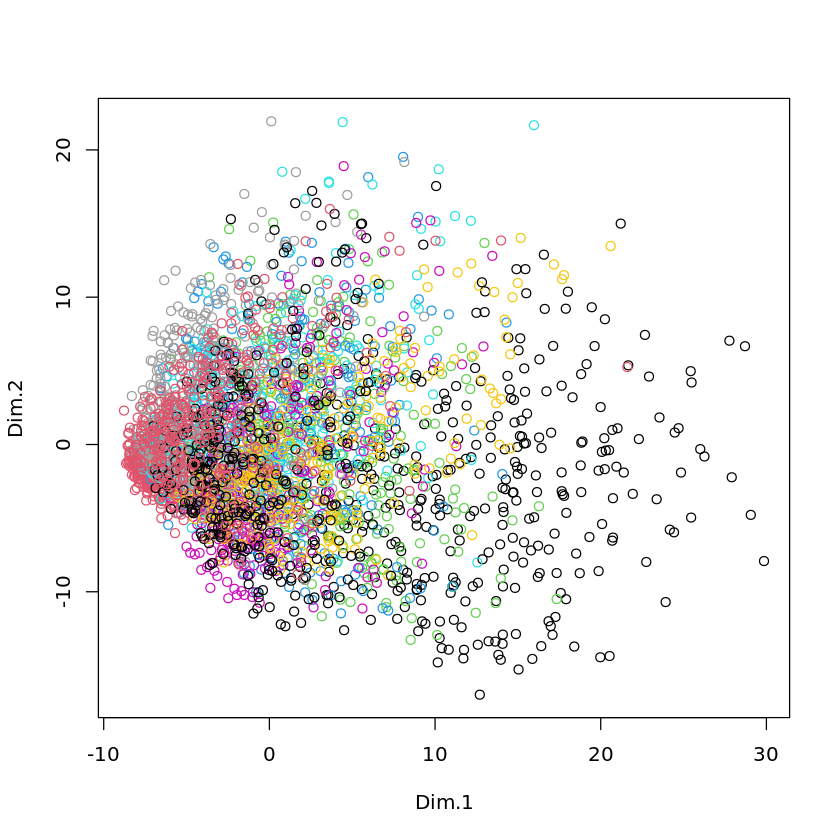

In [ ]:
plot(pca.mnist$ind$coord,col=mnist$y)

In [ ]:
tsne.mnist=Rtsne(mnist$X,dim=2 )

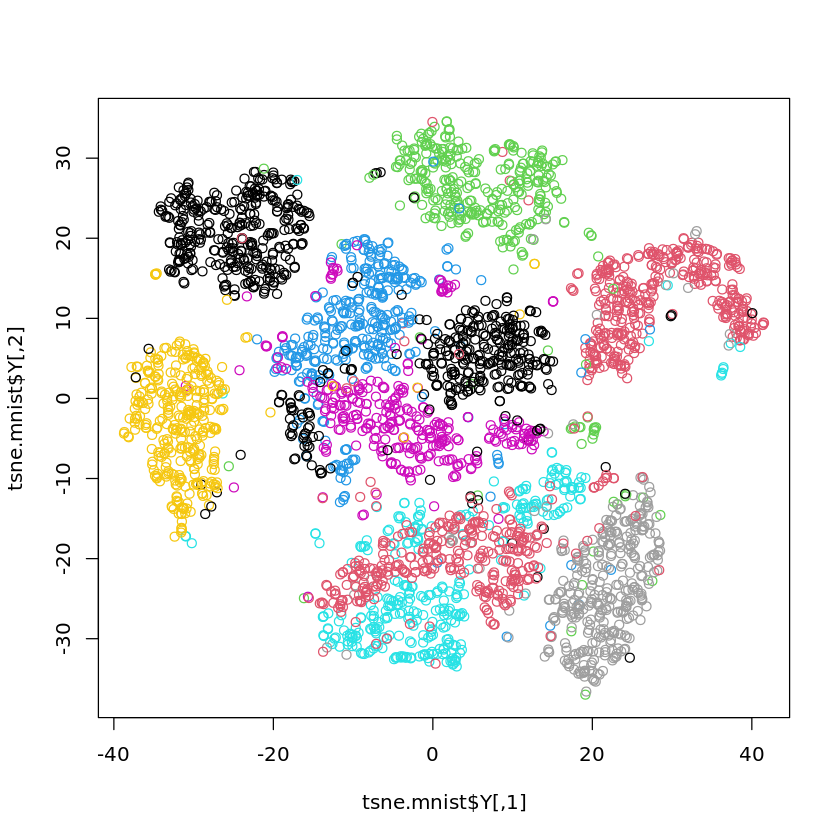

In [ ]:
plot(tsne.mnist$Y,col=mnist$y)

## 4.Partitionnement

### Kmeans

In [ ]:
km.mnist=NbClust(mnist$X, method = "kmeans", distance = "euclidean", index = "silhouette")

Warning message:
“did not converge in 10 iterations”
Warning message:
“did not converge in 10 iterations”
Warning message:
“did not converge in 10 iterations”


In [ ]:
km.mnist$Best.nc

Number_clusters     Value_Index 
         2.0000          0.0842

### Average

In [ ]:
average.mnist=NbClust(mnist$X, method = "average", index = "silhouette")

In [ ]:
average.mnist$Best.nc

Number_clusters     Value_Index 
         2.0000          0.2134

### Ward

In [ ]:
ward.mnist=NbClust(mnist$X, method = "ward.D", index = "silhouette")

In [ ]:
ward.mnist$Best.nc

Number_clusters     Value_Index 
         2.0000          0.0499

### Single

In [ ]:
single.mnist=NbClust(mnist$X, method = "single", index = "silhouette")

In [ ]:
single.mnist$Best.nc

Number_clusters     Value_Index 
         2.0000          0.2015

### Complete

In [ ]:
complete.mnist=NbClust(mnist$X, method = "complete", index = "silhouette")

In [ ]:
complete.mnist$Best.nc

Number_clusters     Value_Index 
         2.0000          0.1198

## 5.HCPC

In [ ]:
hcpcward.mnist=HCPC(pca.mnist,method = "ward", nb.clust=-1)

In [ ]:
hcpcward.mnist$call$t$nb.clust

[1] 3

In [ ]:
hcpccomp.mnist=HCPC(pca.mnist,method = "complete", nb.clust=-1)

In [ ]:
hcpccomp.mnist$call$t$nb.clust

[1] 3

In [ ]:
hcpcsingle.mnist=HCPC(pca.mnist,method = "single", nb.clust=-1)

In [ ]:
hcpcsingle.mnist$call$t$nb.clust

[1] 3

In [ ]:
hcpcav.mnist=HCPC(pca.mnist,method = "average", nb.clust=-1)

In [ ]:
hcpcav.mnist$call$t$nb.clust

[1] 3

## 6. Confusion

In [ ]:
table(ward.mnist$Best.partition, hcpcward.mnist$data.clust$clust)

   
       1    2    3
  1  851  512  577
  2 1183  343   29

In [ ]:
table(ward.mnist$Best.partition, hcpcward.mnist$data.clust$clust)

   
       1    2    3
  1  851  512  577
  2 1183  343   29

## 7.Melange

In [ ]:
pca.mnist = PCA(t(mnist$X), graph = FALSE)

In [ ]:
strategie=mixmodStrategy(algo="EM",initMethod="smallEM",nbTry=10,epsilonInInit=0.00001)

In [ ]:
mmgRmix.mnist=mixmodCluster(data=as.data.frame(pca.mnist$var$coord),nbCluster=3)

In [ ]:
mmgRmix.mnist

****************************************
*** INPUT:
****************************************
* nbCluster =  3 
* criterion =  BIC 
****************************************
*** MIXMOD Models:
* list =  Gaussian_pk_Lk_C 
* This list includes only models with free proportions.
****************************************
* data (limited to a 10x10 matrix) =
    Dim.1  Dim.2  Dim.3  Dim.4    Dim.5   
V1  0.6188 0.3014 0.366  0.0747   -0.1331 
V2  0.4245 0.4126 0.5134 0.04457  -0.07017
V3  0.3078 0.2766 0.183  -0.02488 -0.0747 
V4  0.3343 0.2197 0.1057 0.008451 0.1707  
V5  0.5668 0.2379 0.4308 -0.1025  -0.2999 
V6  0.456  0.3896 0.2371 -0.1491  -0.4223 
V7  0.4738 0.2534 0.1168 0.1979   -0.06435
V8  0.2441 0.2826 0.5014 0.0737   -0.1099 
V9  0.5438 0.3081 0.3939 -0.01526 -0.4129 
V10 0.5759 0.2983 0.3013 -0.07183 -0.185  
* ... ...
****************************************
*** MIXMOD Strategy:
* algorithm            =  EM 
* number of tries      =  1 
* number of iterations =  200 
* epsilon   

In [ ]:
table(mmgRmix.mnist@bestResult@partition,mnist$y)

   
      1   2   3   4   5   6   7   8   9  10
  1  48 390 290 108  41 149 293  35 278  34
  2 297   3  42 236   0 148  27   0  46   3
  3   0   0  17  13 300  18  23 329  17 310

In [ ]:
mmgMclust.mnist=Mclust(data=pca.mnist$var$coord)

In [ ]:
table( mmgMclust.mnist$classification,mnist$y)

   
      1   2   3   4   5   6   7   8   9  10
  1   0   1   2   5 150  11   4 175  11 186
  2   0   0   1   4 128   1   1  18   2 112
  3  36  27 221  15  51  35 290  17  36  10
  4  46  25  17 178   8 199  31   4 225  23
  5   0   0   1   0   2   4   0 145   0   9
  6   0 337   5   0   1   0   0   4   2   1
  7 254   0   3   0   0   0   2   0   0   1
  8   9   3  99 155   1  65  15   1  65   5

Comparaison avec 10 classes

In [ ]:
mmgRmix.mnist=mixmodCluster(data=as.data.frame(pca.mnist$var$coord),nbCluster=10)

In [ ]:
mmgRmix.mnist

****************************************
*** INPUT:
****************************************
* nbCluster =  10 
* criterion =  BIC 
****************************************
*** MIXMOD Models:
* list =  Gaussian_pk_Lk_C 
* This list includes only models with free proportions.
****************************************
* data (limited to a 10x10 matrix) =
    Dim.1  Dim.2  Dim.3  Dim.4    Dim.5   
V1  0.6188 0.3014 0.366  0.0747   -0.1331 
V2  0.4245 0.4126 0.5134 0.04457  -0.07017
V3  0.3078 0.2766 0.183  -0.02488 -0.0747 
V4  0.3343 0.2197 0.1057 0.008451 0.1707  
V5  0.5668 0.2379 0.4308 -0.1025  -0.2999 
V6  0.456  0.3896 0.2371 -0.1491  -0.4223 
V7  0.4738 0.2534 0.1168 0.1979   -0.06435
V8  0.2441 0.2826 0.5014 0.0737   -0.1099 
V9  0.5438 0.3081 0.3939 -0.01526 -0.4129 
V10 0.5759 0.2983 0.3013 -0.07183 -0.185  
* ... ...
****************************************
*** MIXMOD Strategy:
* algorithm            =  EM 
* number of tries      =  1 
* number of iterations =  200 
* epsilon  

In [ ]:
table(mmgRmix.mnist@bestResult@partition,mnist$y)

    
       1   2   3   4   5   6   7   8   9  10
  1   49   8  20  50   2 120  53   1 128   4
  2    0  59   8  11  21  26  18  21  25  10
  3    0 156   2   0   0   1   2   2   4   0
  4  100   4  73 248   0 108  35   1  79   4
  5    0   0   3   5 146  24   3 277  16 207
  6    0 153   0   0   0   0   0   0   0   1
  7  181   0   0   3   0  13   0   0   0   1
  8    0   0   1   2 116   0   3  39   2  98
  9    2   0 114   3   0   1 132   0  13   1
  10  13  13 128  35  56  22  97  23  74  21

In [ ]:
mmgMclust.mnist=Mclust(data=pca.mnist$var$coord, G = 10)

In [ ]:
table( mmgMclust.mnist$classification,mnist$y)

    
       1   2   3   4   5   6   7   8   9  10
  1   23  11   9  97   3 169  26   2 164  10
  2    0   0   0   1 102   0   0  14   1  92
  3  195   0   0   0   0   1   2   0   0   1
  4    0 148   1   0   0   0   0   0   1   0
  5   10   5  42 230   9  93   8   1 123  14
  6   14  32 188  12  71  33 222  23  32  15
  7  103   0 106   8   1   4  83   0   4   0
  8    0   0   1   4   2   7   0 146   0  11
  9    0   2   2   5 152   8   2 176  15 203
  10   0 195   0   0   1   0   0   2   1   1

Les 2 partitions sont peu bonnes

## 9. MclustDR
D'apres la doc MclustDR est une méthode de réduction de dimension pour visualiser la structure de regroupement ou de classification obtenue à partir d'un mélange fini de densités gaussiennes.


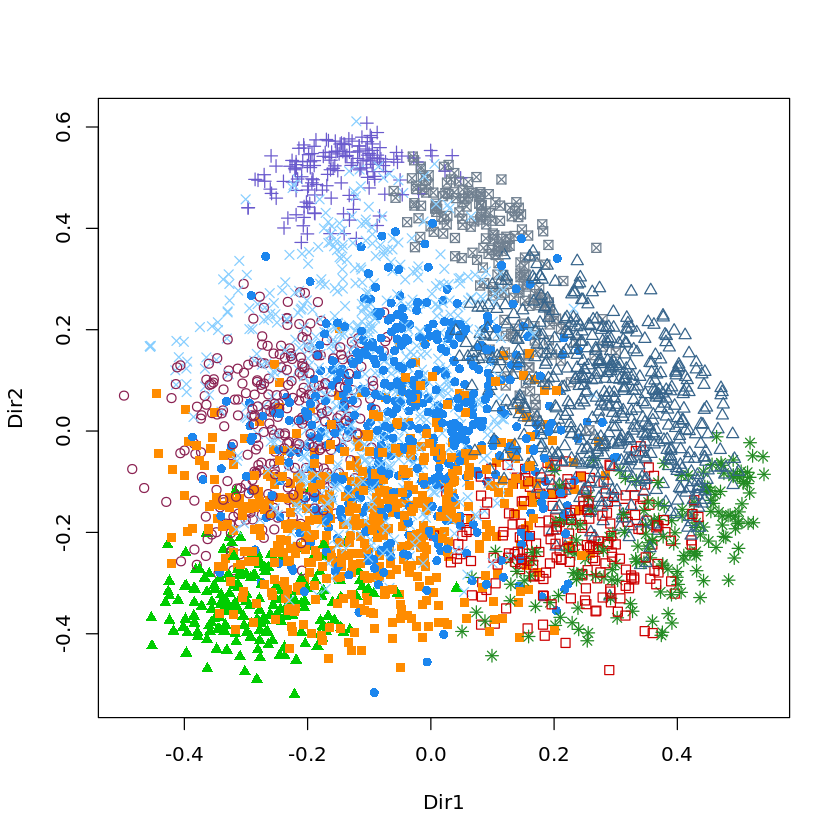

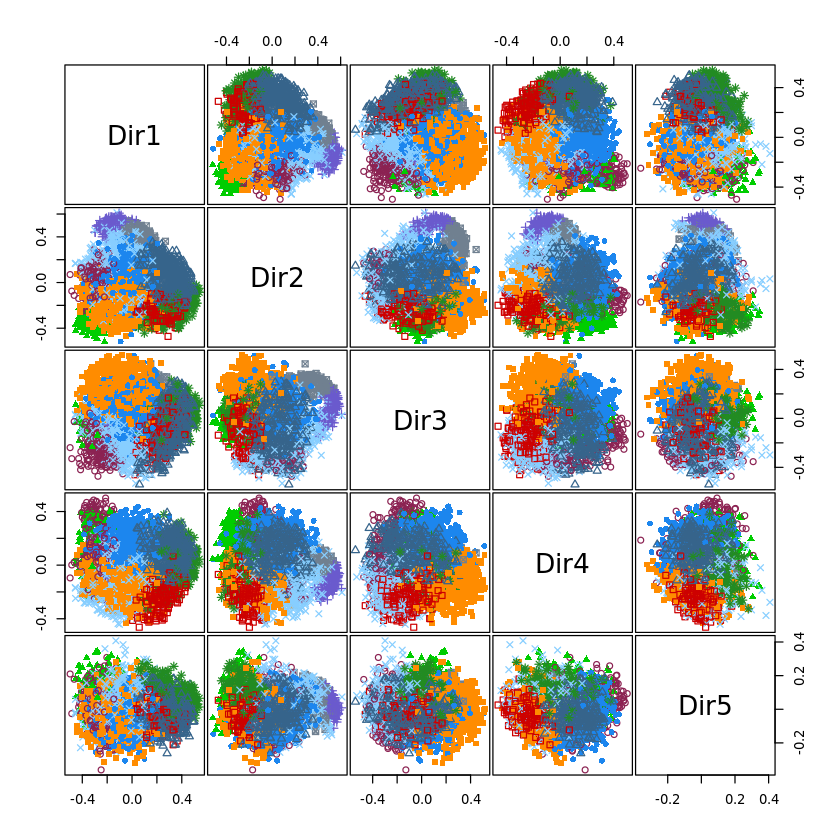

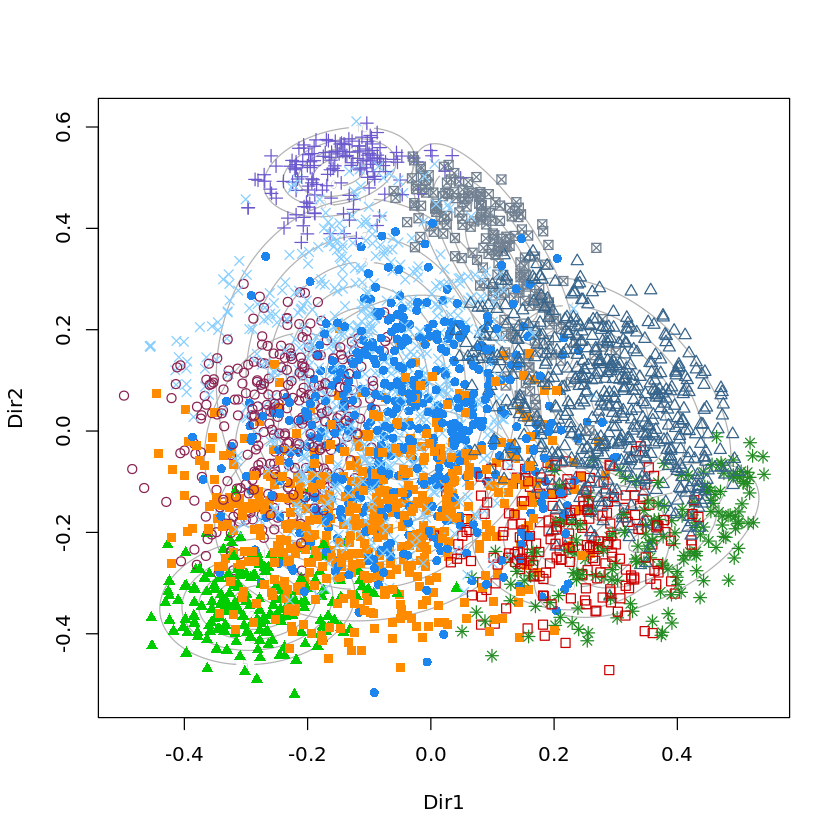

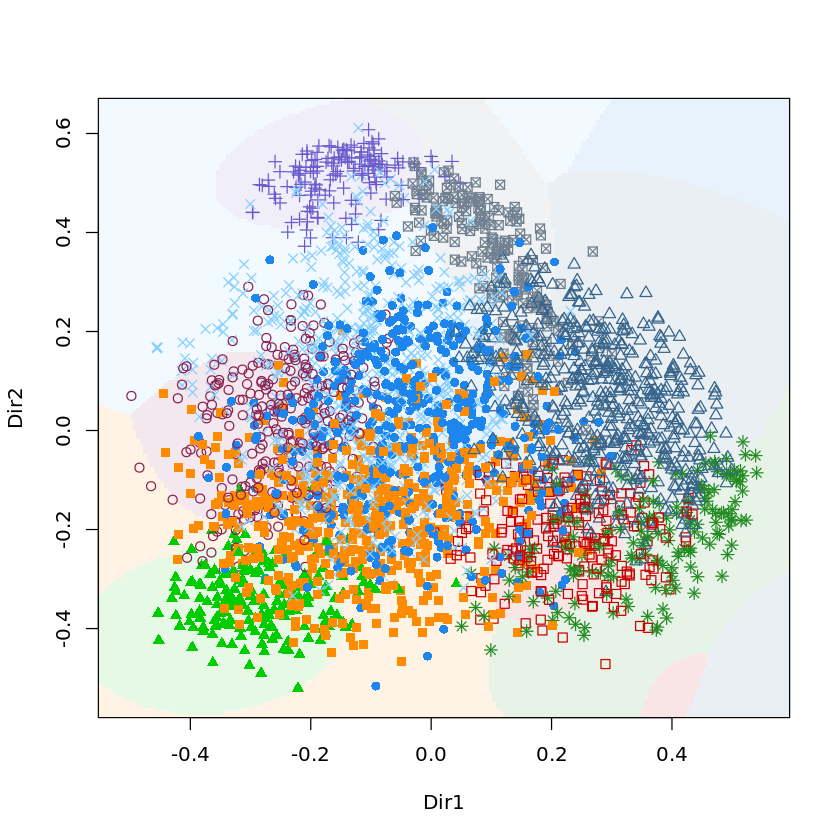

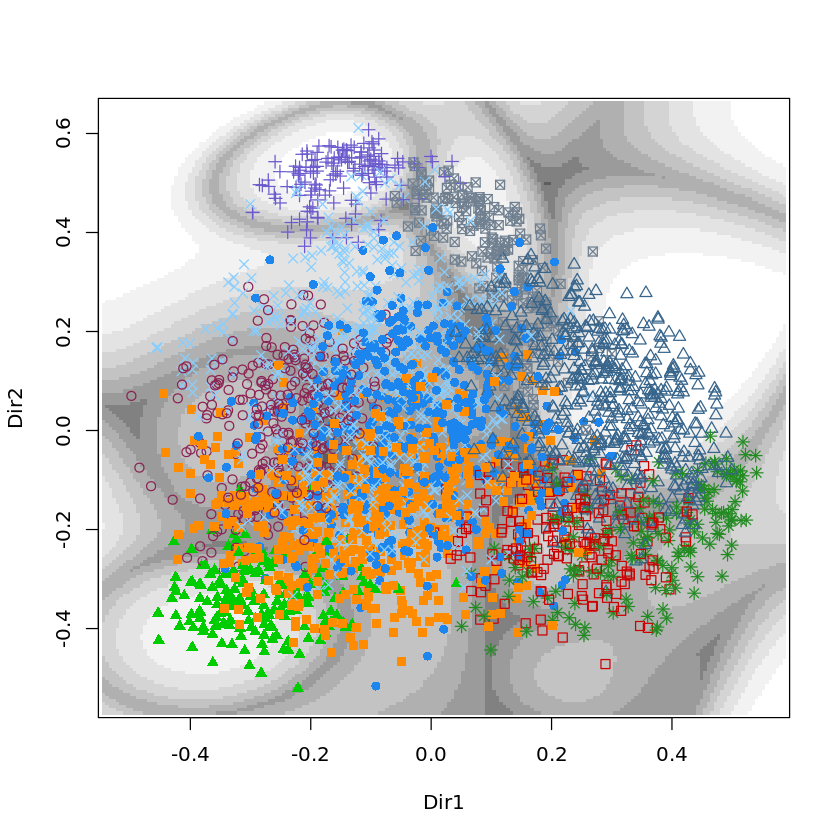

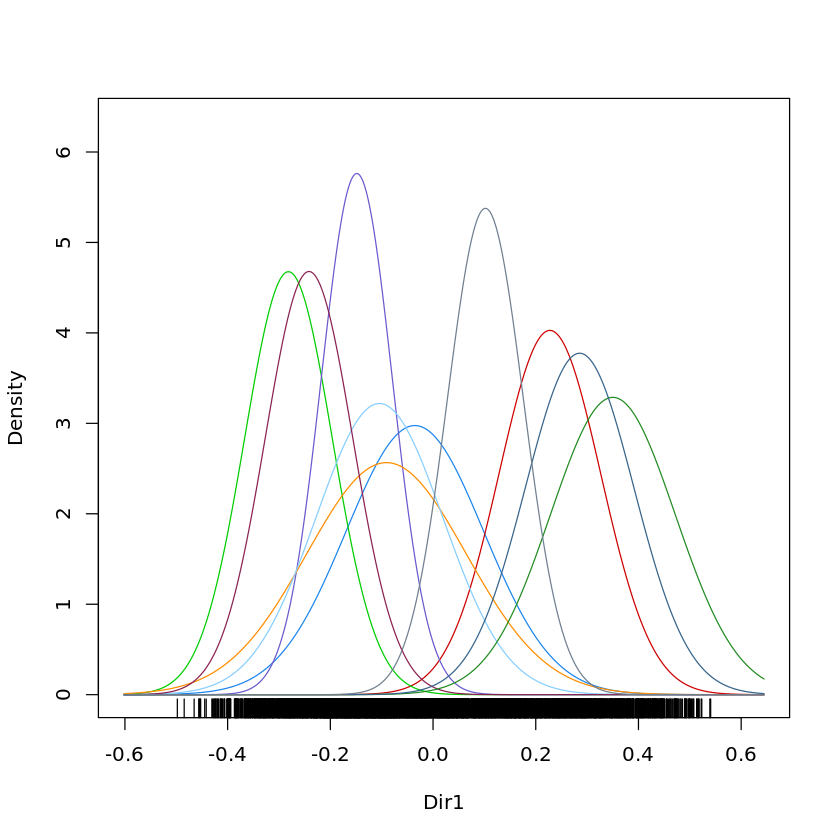

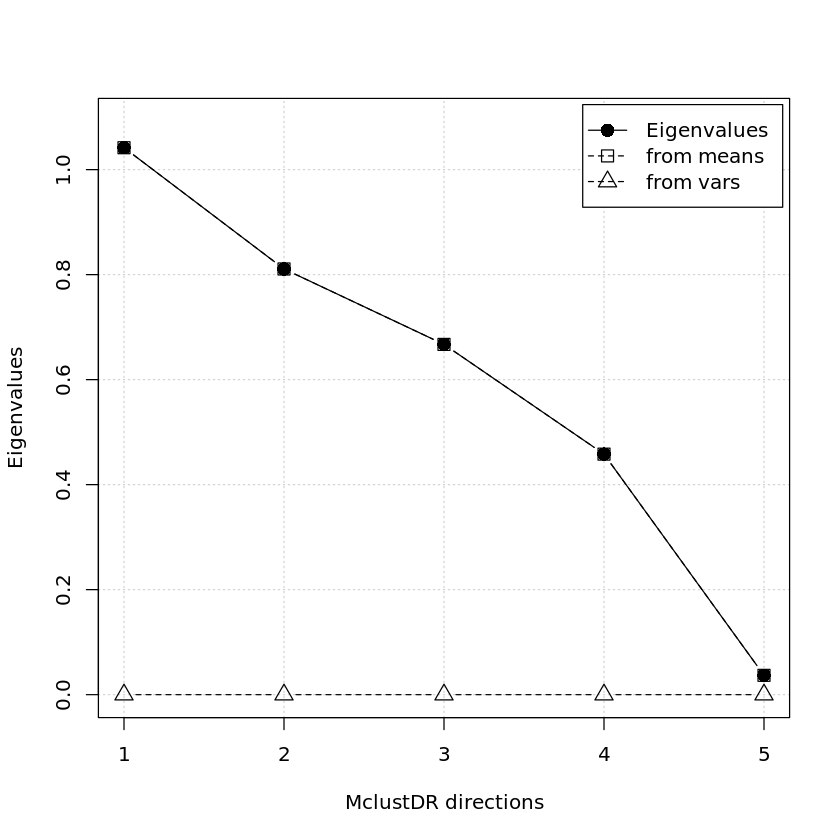

In [ ]:
plot(MclustDR(mmgMclust.mnist))

## 10. Etude comparative

### Kmeans

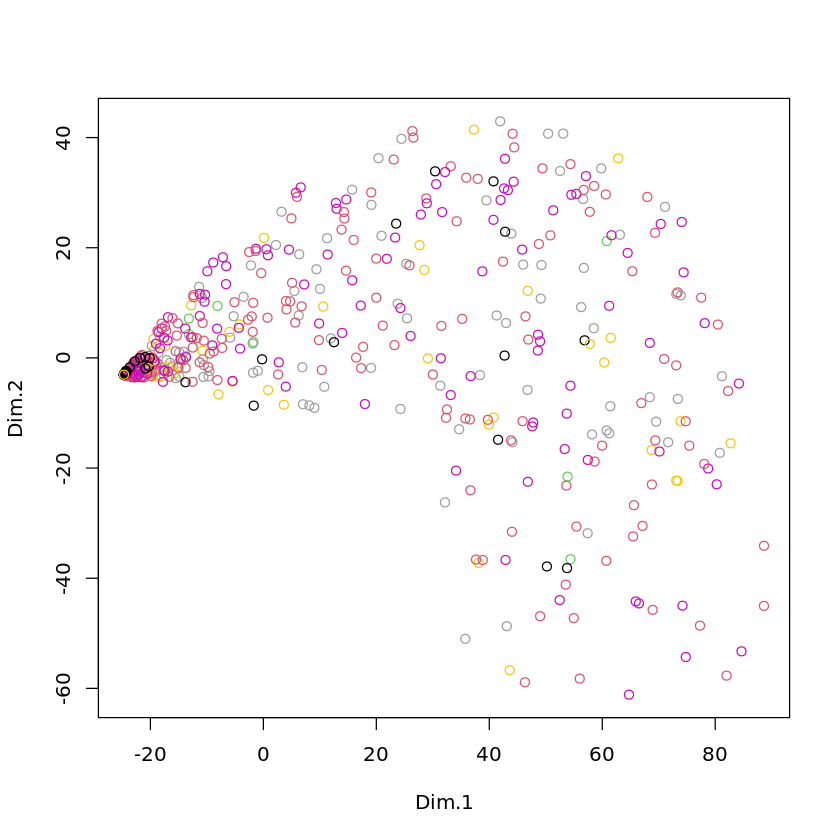

In [ ]:
km.mnist=NbClust(mnist$X, method = "kmeans", distance = "euclidean", index = "silhouette",min.nc = 10,max.nc = 10)
plot(pca.mnist$ind$coord,col=km.mnist$Best.partition)

In [ ]:
unique(as.vector(mnist$y))

[1]  1  2  3  4  5  6  7  8  9 10

In [ ]:
table(km.mnist$Best.partition,as.vector(mnist$y))

    
       1   2   3   4   5   6   7   8   9  10
  1    0   2 246   7   1   0   4   2   2   0
  2    1 214  22  28   6  15  27  12  15  24
  3   11   0   3   1  10   4 244   0   4   1
  4    1   0   6  52   0  73   5   0 214   4
  5    0   0   3   2 110  13   0 215   3 139
  6    0 176  24   2  23  28   5  16  22   3
  7   85   0  17  45   3  64  43   0   9   0
  8  223   0   2   1   0   1   4   1   1   2
  9   24   0  16 208   0  94   2   1  63   5
  10   0   1  10  11 188  23   9 117   8 169

In [ ]:
NMI(km.mnist$Best.partition,as.vector(mnist$y))

[1] 0.4911924

In [ ]:
ARI(km.mnist$Best.partition,as.vector(mnist$y))

[1] 0.3532772

### Average

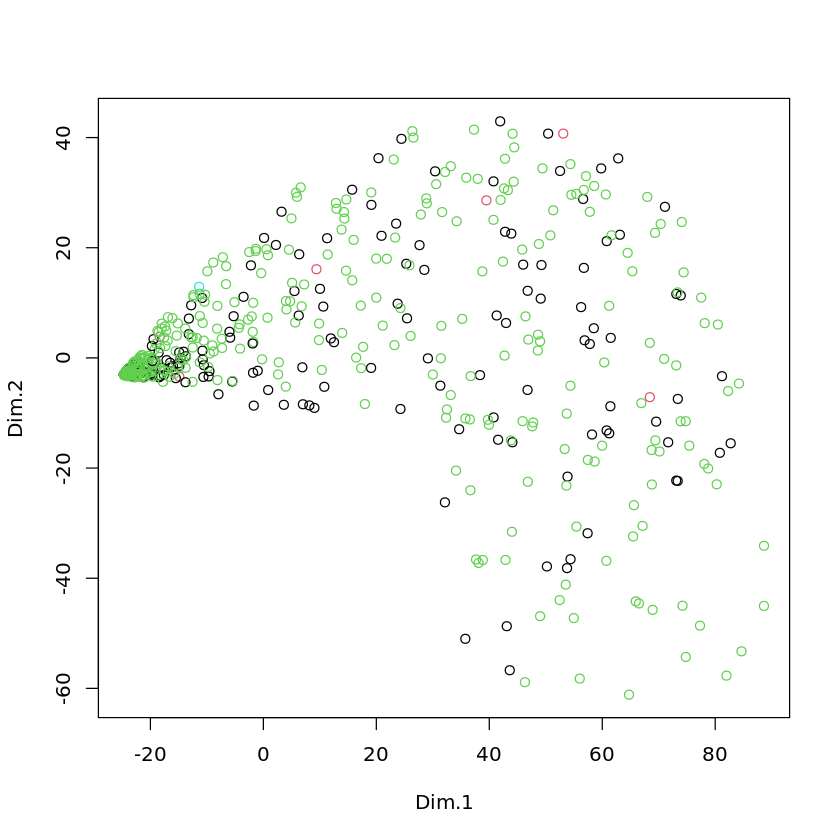

In [ ]:
average.mnist=NbClust(mnist$X, method = "average", distance = "euclidean", index = "silhouette",min.nc = 10,max.nc = 10)
plot(pca.mnist$ind$coord,col=average.mnist$Best.partition)

In [ ]:
table(average.mnist$Best.partition,as.vector(mnist$y))

    
       1   2   3   4   5   6   7   8   9  10
  1  294   0   9   1   1   1   2   0   2   1
  2    9   0   0  10   0   6  10   0   0   0
  3   39 393 315 330 303 289 331 360 315 329
  4    1   0   0   4   0  14   0   0  20   2
  5    2   0   1   0   0   0   0   0   0   0
  6    0   0   7   0   0   0   0   0   4   0
  7    0   0   4   0  37   3   0   4   0  14
  8    0   0  13  12   0   1   0   0   0   0
  9    0   0   0   0   0   1   0   0   0   0
  10   0   0   0   0   0   0   0   0   0   1

In [ ]:
NMI(average.mnist$Best.partition,as.vector(mnist$y))

[1] 0.1295038

In [ ]:
ARI(average.mnist$Best.partition,as.vector(mnist$y))

[1] 0.03737223

### Ward

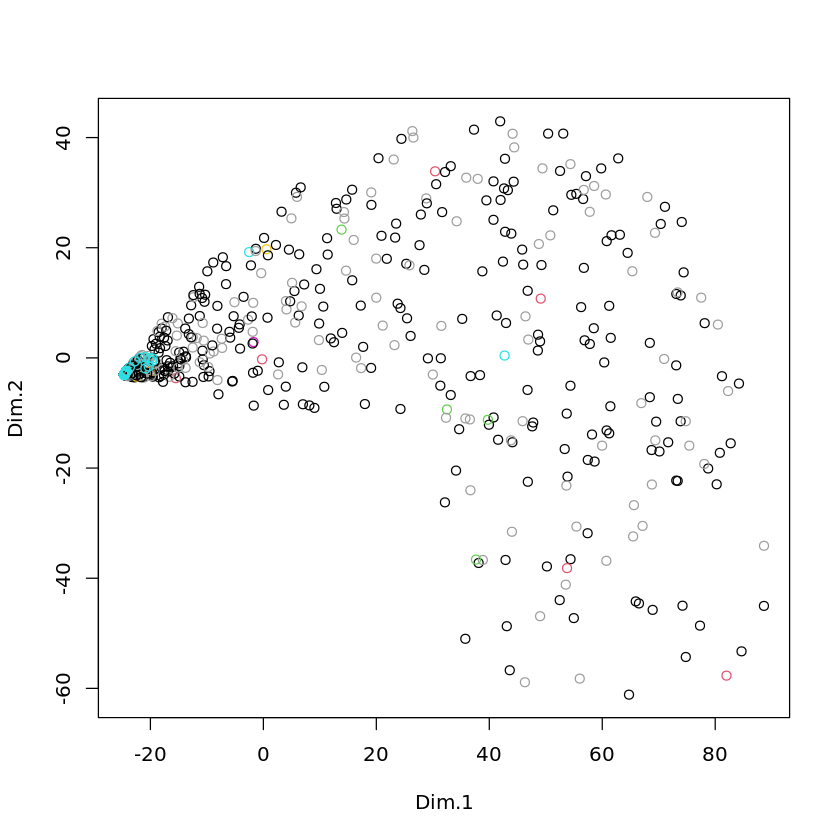

In [ ]:
ward.mnist=NbClust(mnist$X, method = "ward.D", distance = "euclidean", index = "silhouette",min.nc = 10,max.nc = 10)
plot(pca.mnist$ind$coord,col=ward.mnist$Best.partition)

In [ ]:
table(ward.mnist$Best.partition,as.vector(mnist$y))

    
       1   2   3   4   5   6   7   8   9  10
  1  327   1   7  10   2  29  15   0   2   1
  2   10   2   5 156   0  82   6   2  64   5
  3    1   6   5 177   1 130   5   0 248   7
  4    4   0   0   0   4   0 310   0   1   0
  5    1   5 297   4   0   0   0   4   4   0
  6    1   1   8   7  93   4   0 216   6 216
  7    1   2  25   2  77  66   5  63  10  25
  8    0 177   0   1   0   0   0   0   0   0
  9    0 199   1   0   1   0   2   6   5   0
  10   0   0   1   0 163   4   0  73   1  93

In [ ]:
NMI(ward.mnist$Best.partition,as.vector(mnist$y))

[1] 0.5946189

In [ ]:
ARI(ward.mnist$Best.partition,as.vector(mnist$y))

[1] 0.4544558

### Complete

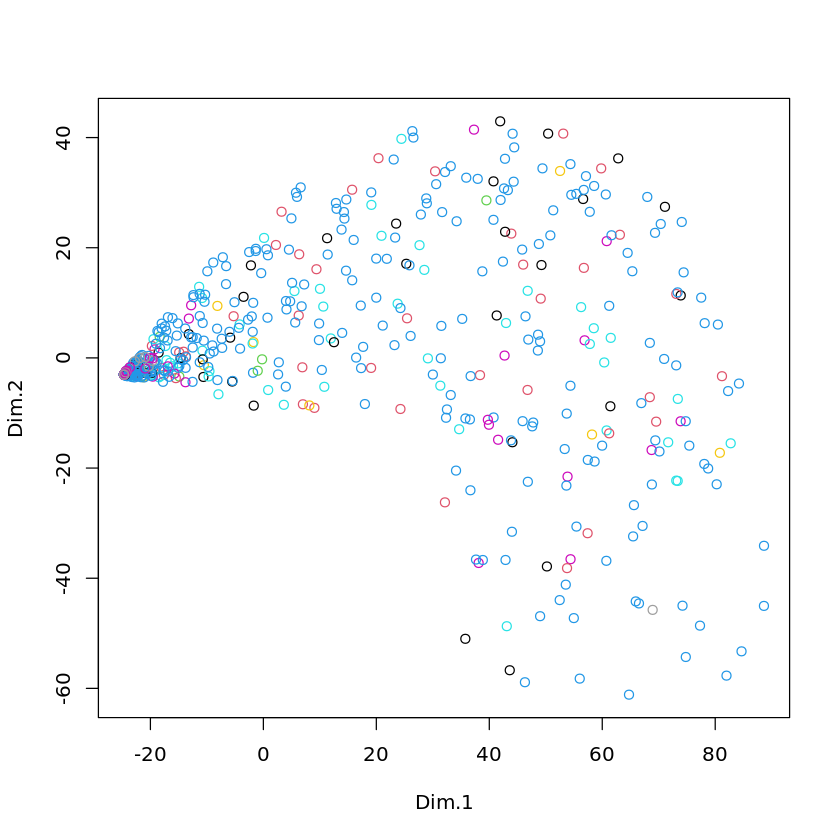

In [ ]:
complete.mnist=NbClust(mnist$X, method = "complete", distance = "euclidean", index = "silhouette",min.nc = 10,max.nc = 10)
plot(pca.mnist$ind$coord,col=complete.mnist$Best.partition)

In [ ]:
table(complete.mnist$Best.partition,as.vector(mnist$y))

    
       1   2   3   4   5   6   7   8   9  10
  1   73   0  17  88   0  16   1   0   8   2
  2   96   0   2   0   0   2   1   0   0   0
  3   12   0   0  14   7   6  27   9   9   1
  4   16 388  54 149 276 172  16 309 238 311
  5  100   0   3   3   1   5   2   0   1   1
  6   33   4 148   7   6  13  97  26   6   3
  7   15   0  13   2  21   4 199   3   1   8
  8    0   1 112   8   0   2   0   0   3   0
  9    0   0   0  86   4  95   0   0  75   3
  10   0   0   0   0  26   0   0  17   0  18

In [ ]:
NMI(complete.mnist$Best.partition,as.vector(mnist$y))

[1] 0.2891662

In [ ]:
ARI(complete.mnist$Best.partition,as.vector(mnist$y))

[1] 0.1182318

### Single

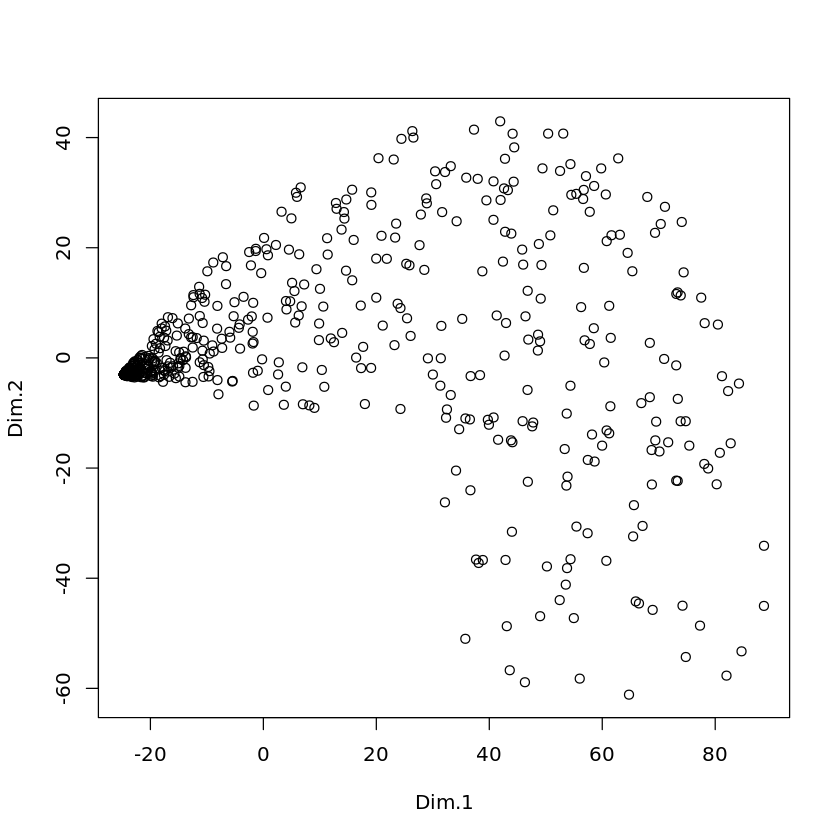

In [ ]:
single.mnist=NbClust(mnist$X, method = "single", distance = "euclidean", index = "silhouette",min.nc = 10,max.nc = 10)
plot(pca.mnist$ind$coord,col=single.mnist$Best.partition)

In [ ]:
table(single.mnist$Best.partition,as.vector(mnist$y))

    
       1   2   3   4   5   6   7   8   9  10
  1  345 393 348 355 341 314 343 363 339 345
  2    0   0   1   0   0   0   0   0   0   0
  3    0   0   0   1   0   0   0   0   0   0
  4    0   0   0   1   0   0   0   0   0   0
  5    0   0   0   0   0   1   0   0   0   0
  6    0   0   0   0   0   0   0   1   0   0
  7    0   0   0   0   0   0   0   0   1   0
  8    0   0   0   0   0   0   0   0   1   0
  9    0   0   0   0   0   0   0   0   0   1
  10   0   0   0   0   0   0   0   0   0   1

In [ ]:
NMI(single.mnist$Best.partition,as.vector(mnist$y))

[1] 0.002588649

In [ ]:
ARI(single.mnist$Best.partition,as.vector(mnist$y))

[1] 1.31896e-05

### MMG

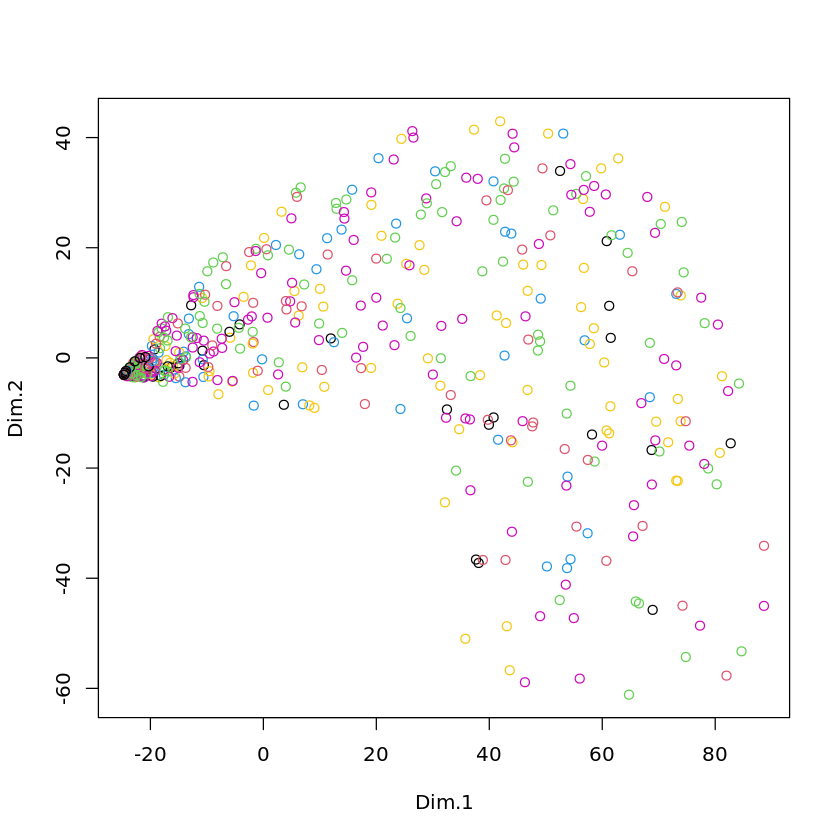

In [ ]:
plot(pca.mnist$ind$coord,col=mmgRmix.mnist@bestResult@partition)

In [ ]:
table(mmgRmix.mnist@bestResult@partition,as.vector(mnist$y))

    
       1   2   3   4   5   6   7   8   9  10
  1   49   8  20  50   2 120  53   1 128   4
  2    0  59   8  11  21  26  18  21  25  10
  3    0 156   2   0   0   1   2   2   4   0
  4  100   4  73 248   0 108  35   1  79   4
  5    0   0   3   5 146  24   3 277  16 207
  6    0 153   0   0   0   0   0   0   0   1
  7  181   0   0   3   0  13   0   0   0   1
  8    0   0   1   2 116   0   3  39   2  98
  9    2   0 114   3   0   1 132   0  13   1
  10  13  13 128  35  56  22  97  23  74  21

In [ ]:
NMI(mmgRmix.mnist@bestResult@partition,as.vector(mnist$y))

[1] 0.396184

In [ ]:
ARI(mmgRmix.mnist@bestResult@partition,as.vector(mnist$y))

[1] 0.2378217

In [ ]:
table( mmgMclust.mnist$classification,mnist$y)

    
       1   2   3   4   5   6   7   8   9  10
  1   23  11   9  97   3 169  26   2 164  10
  2    0   0   0   1 102   0   0  14   1  92
  3  195   0   0   0   0   1   2   0   0   1
  4    0 148   1   0   0   0   0   0   1   0
  5   10   5  42 230   9  93   8   1 123  14
  6   14  32 188  12  71  33 222  23  32  15
  7  103   0 106   8   1   4  83   0   4   0
  8    0   0   1   4   2   7   0 146   0  11
  9    0   2   2   5 152   8   2 176  15 203
  10   0 195   0   0   1   0   0   2   1   1

In [ ]:
NMI(mmgMclust.mnist$classification,as.vector(mnist$y))

[1] 0.459627

In [ ]:
ARI(mmgMclust.mnist$classification,as.vector(mnist$y))

[1] 0.279343

### Conclusion

On peut voir que Ward > kmeans > MMG >> Complete>Average>>Single

## t-SNE

In [ ]:
tsne.mnist = Rtsne(mnist$X,dim=2 )

### MMG

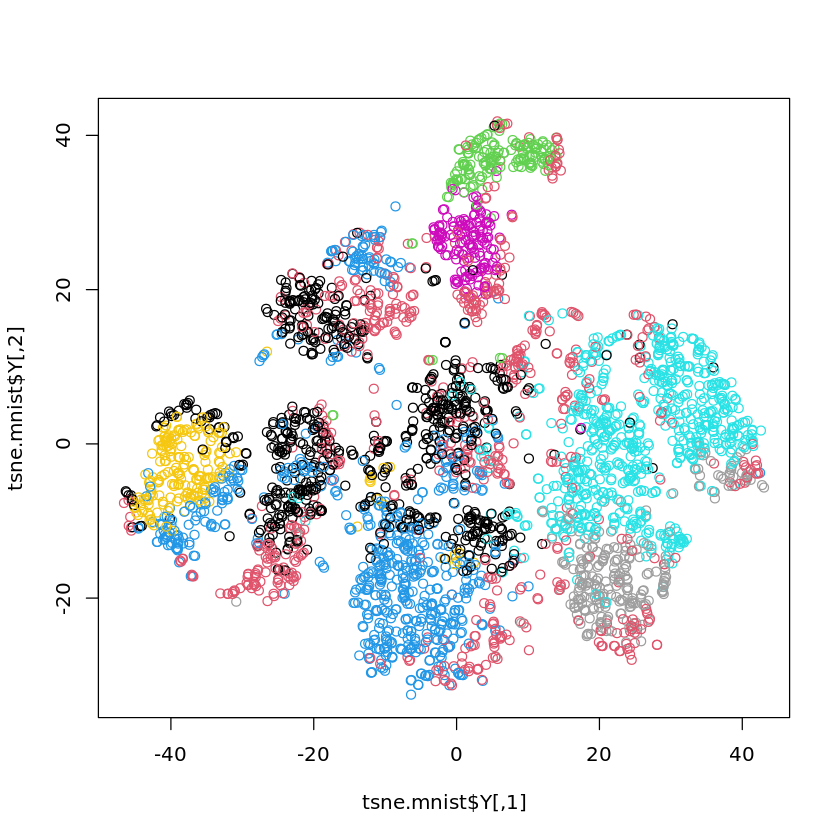

In [ ]:
plot(tsne.mnist$Y,col=mmgRmix.mnist@bestResult@partition)

### Kmeans

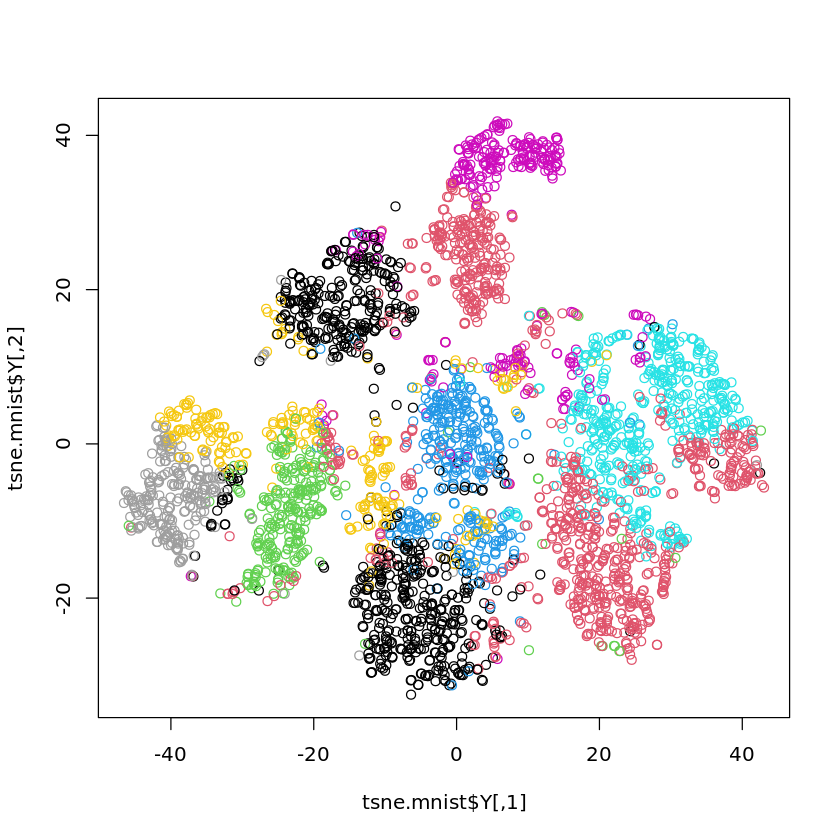

In [ ]:
plot(tsne.mnist$Y,col=km.mnist$Best.partition)

### Average

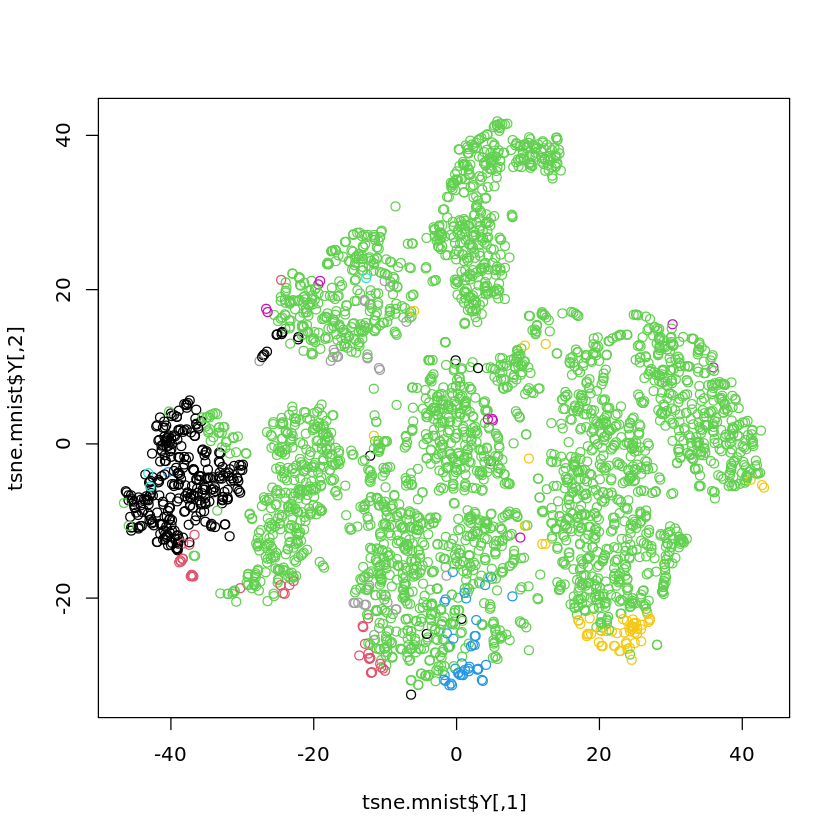

In [ ]:
plot(tsne.mnist$Y,col=average.mnist$Best.partition)

### Ward

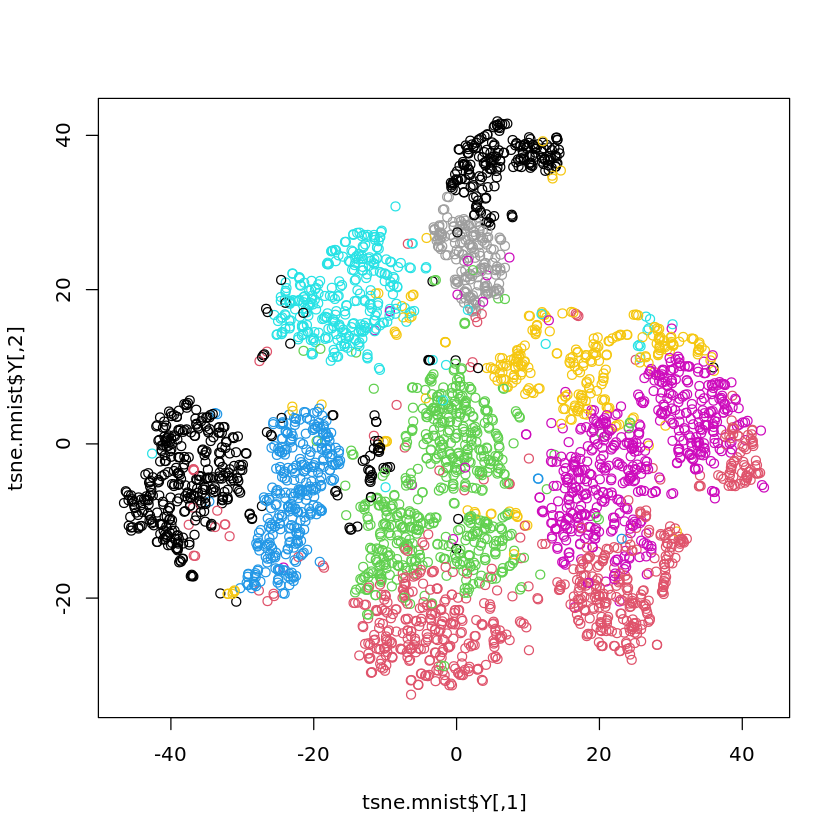

In [ ]:
plot(tsne.mnist$Y,col=ward.mnist$Best.partition)

### Single

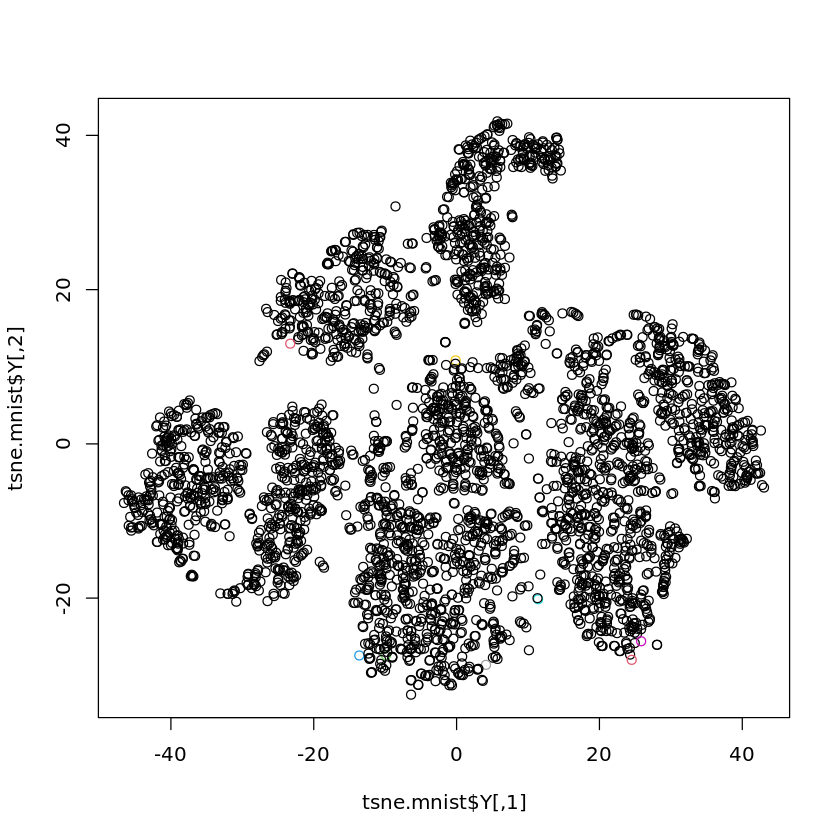

In [ ]:
plot(tsne.mnist$Y,col=single.mnist$Best.partition)

### Complete

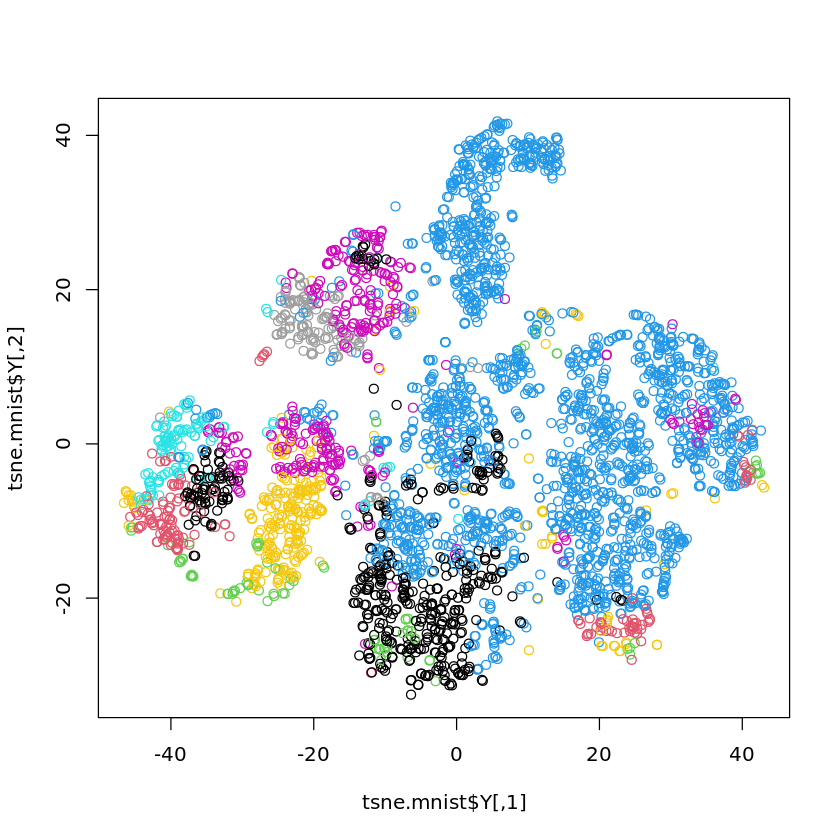

In [ ]:
plot(tsne.mnist$Y,col=complete.mnist$Best.partition)

## UMAP

In [ ]:
umap.mnist = umap(mnist$X)

In [ ]:
umap.mnist

umap embedding of 3495 items in 2 dimensions
object components: layout, data, knn, config



### MMG

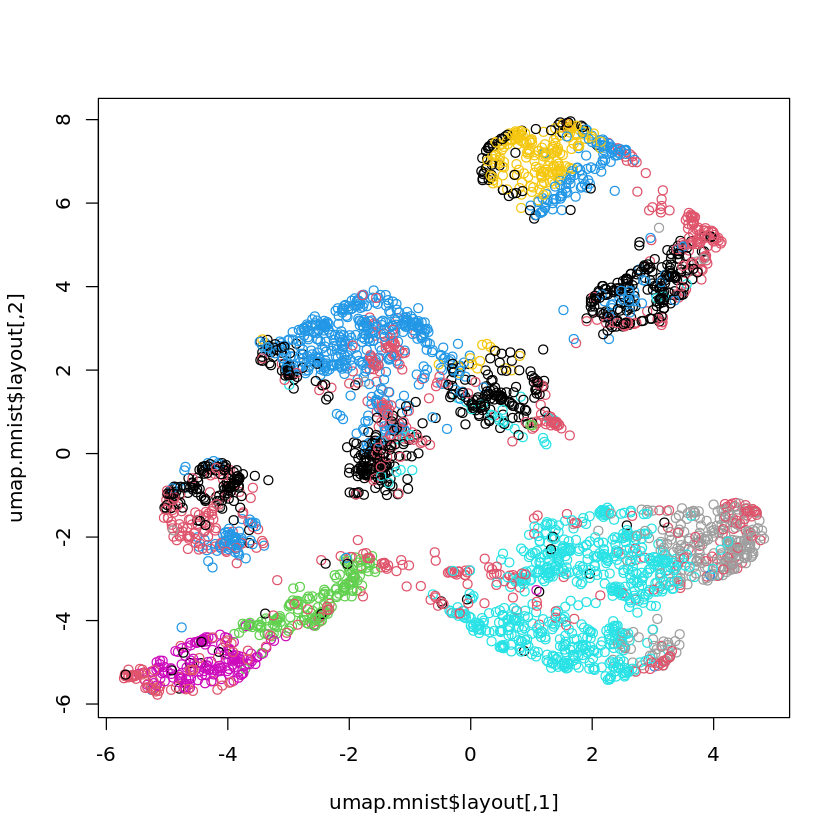

In [ ]:
plot(umap.mnist$layout,col=mmgRmix.mnist@bestResult@partition)

### Kmeans

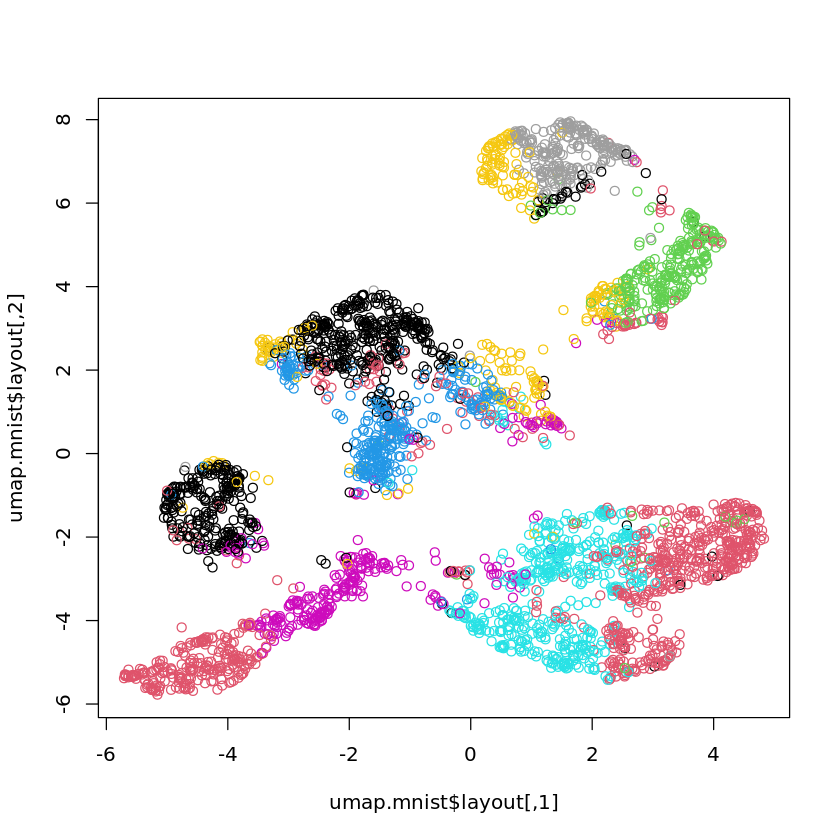

In [ ]:
plot(umap.mnist$layout,col=km.mnist$Best.partition)

### Average

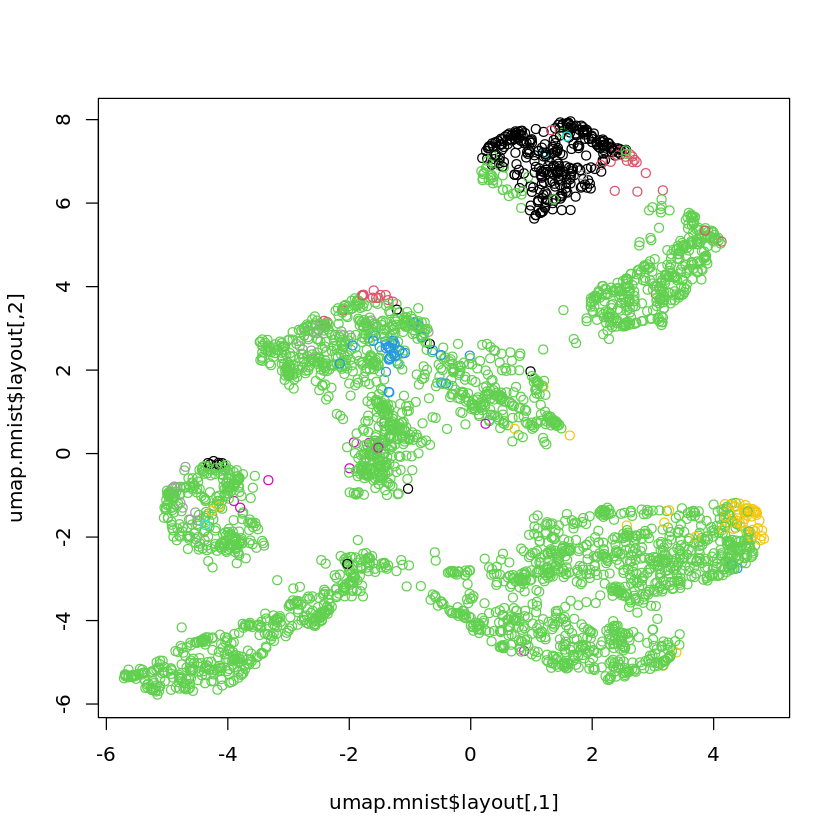

In [ ]:
plot(umap.mnist$layout,col=average.mnist$Best.partition)

### Ward

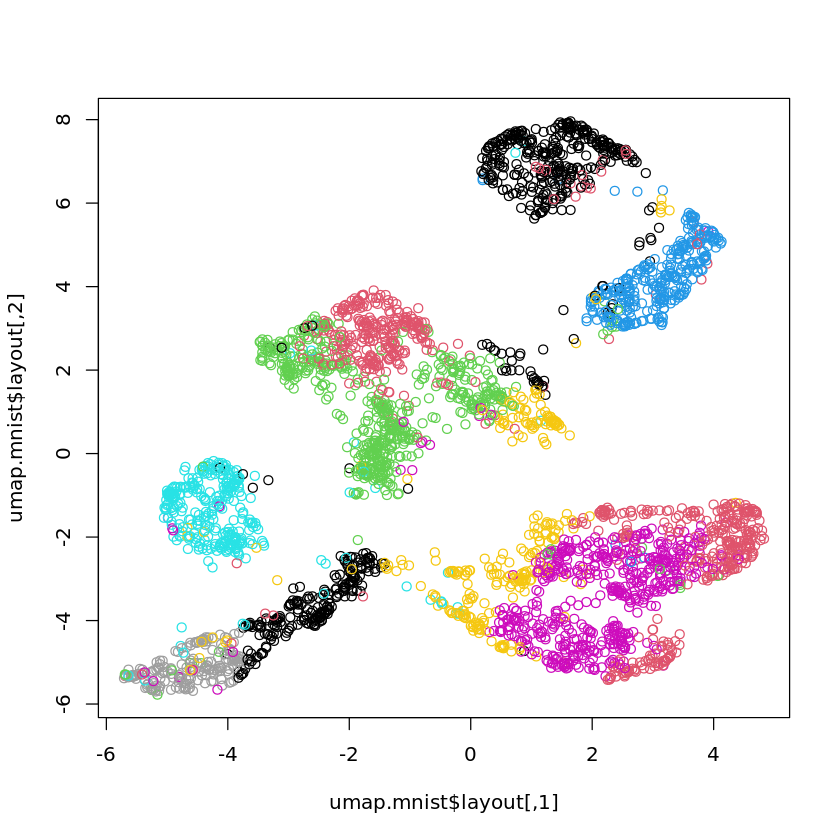

In [ ]:
plot(umap.mnist$layout,col=ward.mnist$Best.partition)

### Single

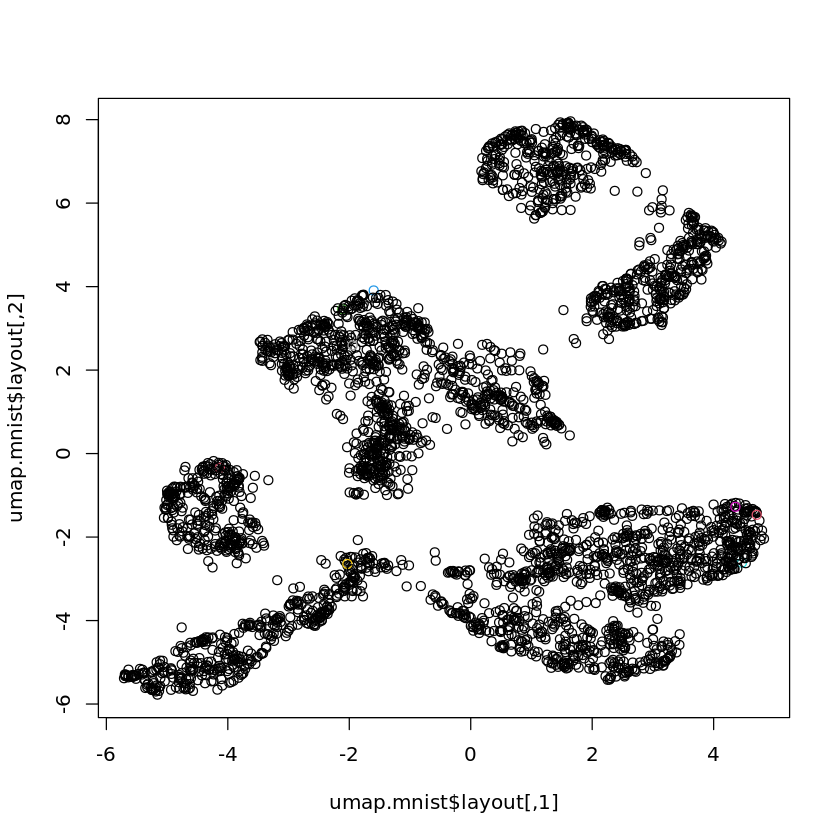

In [ ]:
plot(umap.mnist$layout,col=single.mnist$Best.partition)

### Complete

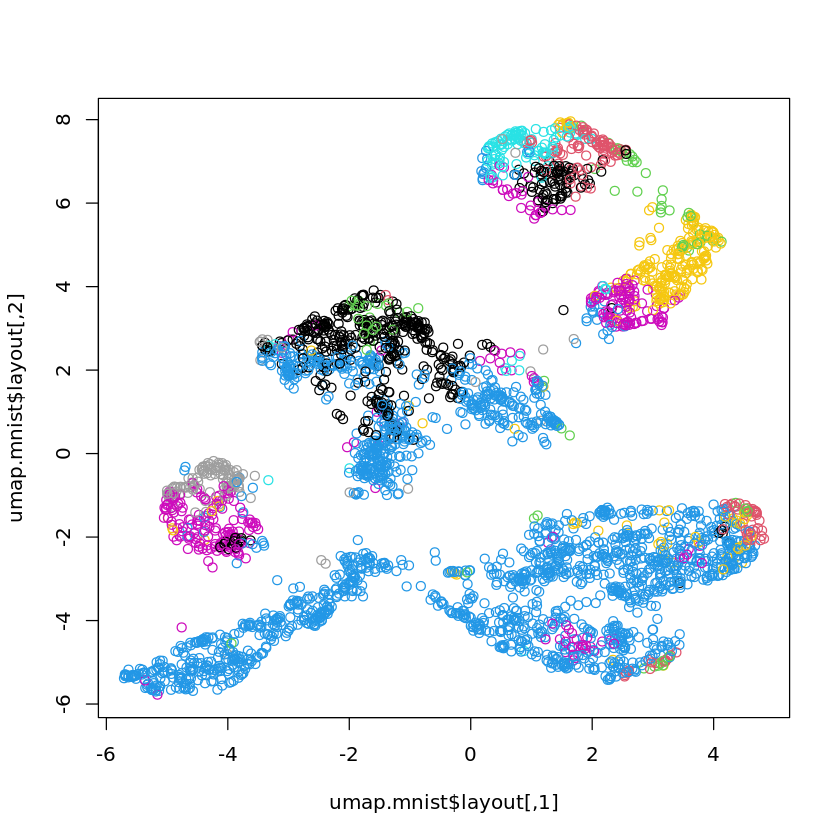

In [ ]:
plot(umap.mnist$layout,col=complete.mnist$Best.partition)

## Autoencoder

In [ ]:
mnist_reduced <- read.csv(file = 'data/mnist_reduced.csv', header=F)

In [ ]:
mmgMclust.mnist_reduced=Mclust(data= mnist_reduced)

In [ ]:
mmgMclust.mnist_reduced

'Mclust' model object: (VVV,4) 

Available components: 
 [1] "call"           "data"           "modelName"      "n"             
 [5] "d"              "G"              "BIC"            "loglik"        
 [9] "df"             "bic"            "icl"            "hypvol"        
[13] "parameters"     "z"              "classification" "uncertainty"   

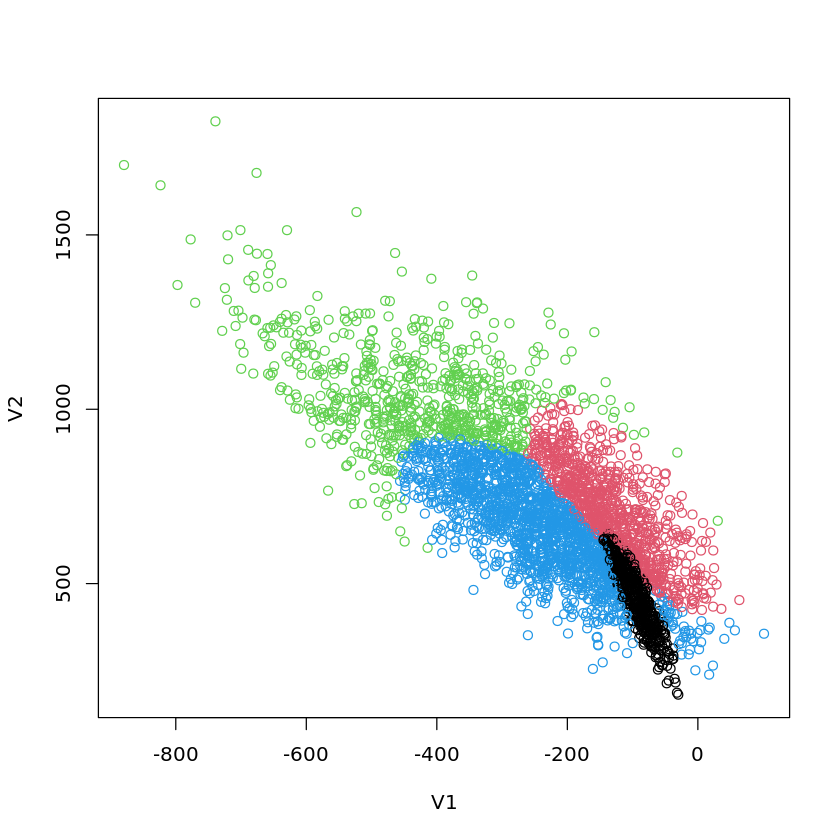

In [ ]:
plot(mnist_reduced,col=mmgMclust.mnist_reduced$classification)

In [ ]:
table(mmgMclust.mnist_reduced$classification,mnist$y)

   
      1   2   3   4   5   6   7   8   9  10
  1   1 284  19  33  31  21   0  53   9  46
  2   2  69  84 189  43  52   3 124 132  99
  3 199   5  77  62  34  46 111  12 131  37
  4 143  35 169  73 233 196 229 175  69 165

In [ ]:
NMI(mmgMclust.mnist_reduced$classification,as.vector(mnist$y))

[1] 0.1280028

In [ ]:
ARI(mmgMclust.mnist_reduced$classification,as.vector(mnist$y))

[1] 0.08125689

In [ ]:
mmgMclust.mnist_reduced=Mclust(data= mnist_reduced, G=10)

In [ ]:
mmgMclust.mnist_reduced

'Mclust' model object: (VEE,10) 

Available components: 
 [1] "call"           "data"           "modelName"      "n"             
 [5] "d"              "G"              "BIC"            "loglik"        
 [9] "df"             "bic"            "icl"            "hypvol"        
[13] "parameters"     "z"              "classification" "uncertainty"   

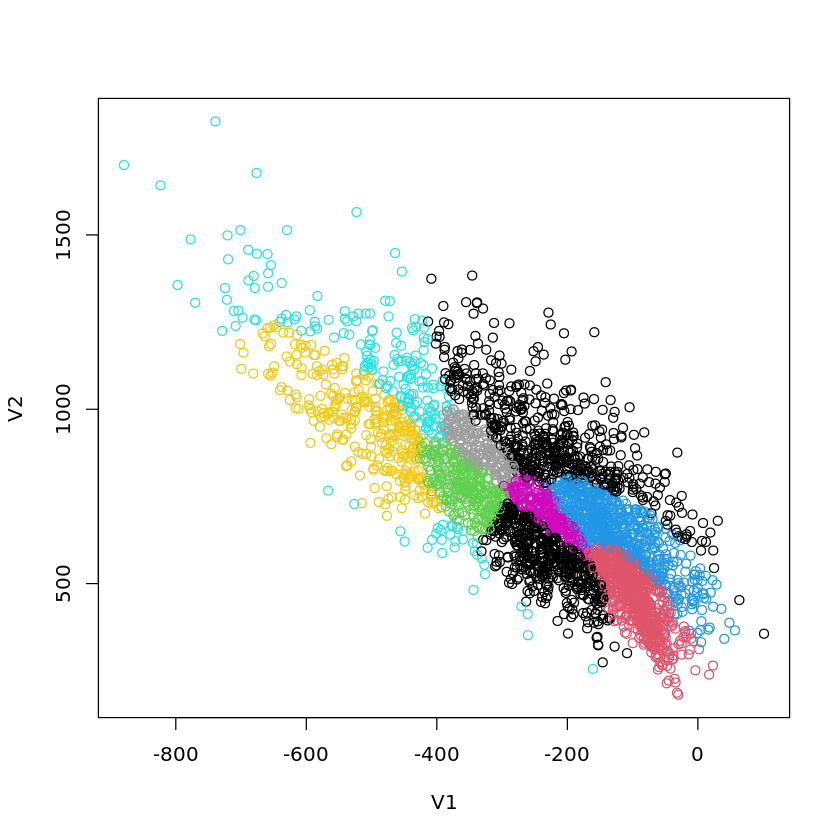

In [ ]:
plot(mnist_reduced,col=mmgMclust.mnist_reduced$classification)

In [ ]:
table(mmgMclust.mnist_reduced$classification,mnist$y)

    
       1   2   3   4   5   6   7   8   9  10
  1   40   6  46   9  82  76  89  59  10  40
  2    0 130  15  29  38  22   1  59  15  52
  3   46   0  46   7  31  33  66  19   9  17
  4    6  71  65 112  46  46   3 112  70  91
  5   73   0  27  13  17  13  38   2  26   9
  6   13   7  26  15  43  36  18  29  21  39
  7  121   0  31   2  19   4  97   0   4   9
  8   33   0  26   8  23  30  23  14  14  23
  9    8  24  56 142  23  44   2  39 170  46
  10   5 155  11  20  19  11   6  31   2  21

In [ ]:
NMI(mmgMclust.mnist_reduced$classification,as.vector(mnist$y))

[1] 0.1652805

In [ ]:
ARI(mmgMclust.mnist_reduced$classification,as.vector(mnist$y))

[1] 0.0902898

l'autenencoder n'arrive pas a bien apprender une bonne representation qui separe les classes

## Testing MMG avec UMAP

In [ ]:
mmgMclust.mnist_umap=Mclust(data= umap.mnist$layout)

In [ ]:
mmgMclust.mnist_umap

'Mclust' model object: (VVV,9) 

Available components: 
 [1] "call"           "data"           "modelName"      "n"             
 [5] "d"              "G"              "BIC"            "loglik"        
 [9] "df"             "bic"            "icl"            "hypvol"        
[13] "parameters"     "z"              "classification" "uncertainty"   

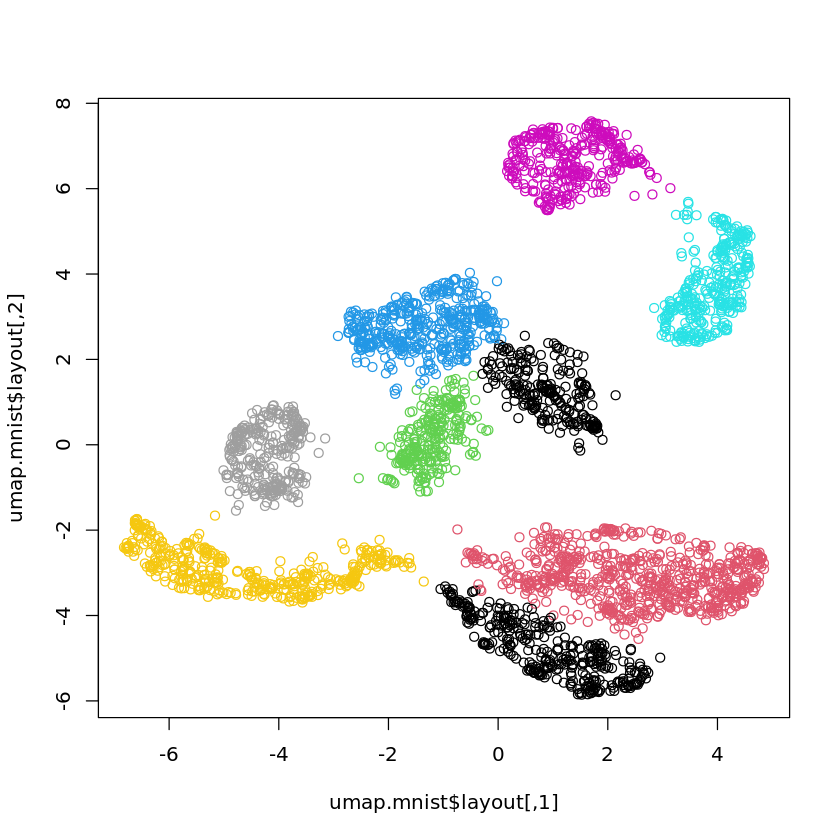

In [ ]:
plot(umap.mnist$layout,col=mmgMclust.mnist_umap$classification)

In [ ]:
table(mmgMclust.mnist_umap$classification,mnist$y)

   
      1   2   3   4   5   6   7   8   9  10
  1   0   0   9   5   0   0   0 331   1  10
  2   0   3  20   5 328   8   0  19   8 328
  3   1   0   6   4   0   5   2   0 255   3
  4   1   0   3 323   0  76   1   0  52   3
  5   5   0   0   1   3   7 329   0   4   0
  6 337   0   4   0   1   1   9   0   3   2
  7   0 387  15   6   9   2   2  11  11   1
  8   0   3 290   2   0   0   0   2   0   0
  9   1   0   2  11   0 216   0   1   7   0

In [ ]:
NMI(mmgMclust.mnist_umap$classification,as.vector(mnist$y))

[1] 0.7473948

In [ ]:
ARI(mmgMclust.mnist_umap$classification,as.vector(mnist$y))

[1] 0.6992806

Utilisation de UMAP permet d'avoir un representations des classes qui sont separable et permet au modeles d'avoir des meilleures performances